## Binary Classification Problem End-2-End

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [19]:
!pip install -U scikit-learn -q #v 1.5.0

ERROR: Invalid requirement: '#v'


In [2]:
## RESTART RUNTIME!!!!!!!!!!!!!!!!!!!!

In [3]:
path = "https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data"
df = pd.read_csv(path,
                names=["id","diagnosis","radius_mean","texture_mean","perimeter_mean","area_mean","smoothness_mean",
                        "compactness_mean","concavity_mean","concave points_mean","symmetry_mean","fractal_dimension_mean",
                        "radius_se","texture_se","perimeter_se","area_se","smoothness_se","compactness_se","concavity_se",
                        "concave points_se","symmetry_se","fractal_dimension_se","radius_worst","texture_worst","perimeter_worst",
                        "area_worst","smoothness_worst","compactness_worst","concavity_worst","concave points_worst","symmetry_worst",
                        "fractal_dimension_worst"])

df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [5]:
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [6]:
## TARGET NUMERICAL
df['diagnosis'] = df['diagnosis'].map({'B':0,'M':1})

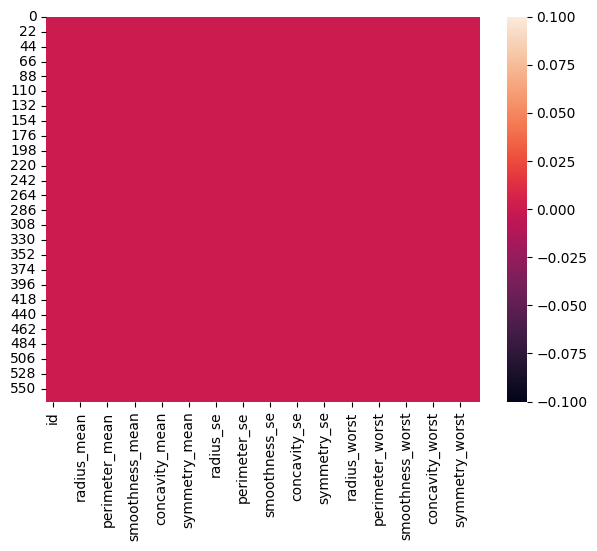

In [ ]:
plt.figure(figsize=(7,5))
sns.heatmap(df.isnull());

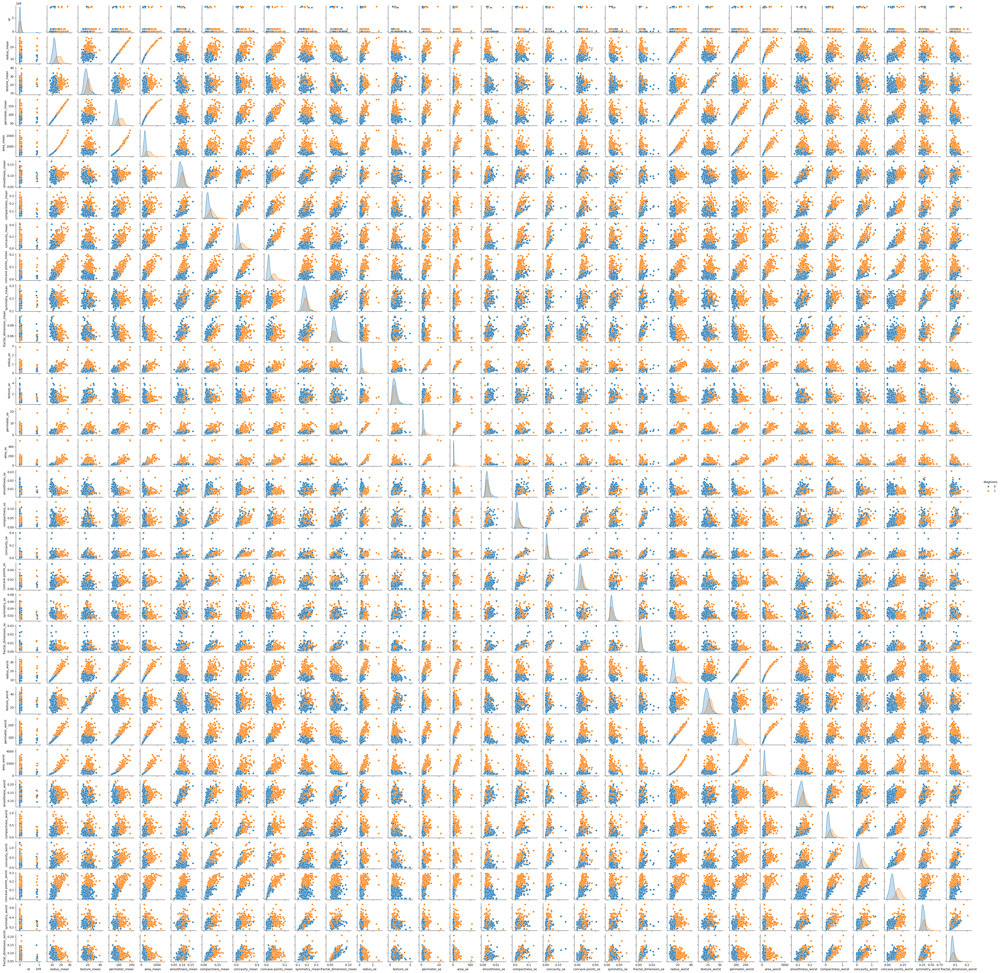

In [ ]:
sns.pairplot(df,hue='diagnosis',height=1.5)

In [ ]:
!pip install jupyter-summarytools -q

In [ ]:
from summarytools import dfSummary
dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,id[int64],Mean (sd) : 30371831.4 (125020585.6)min < med < max:8670.0 < 906024.0 < 911320502.0IQR (CV) : 7943911.0 (0.2),569 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8fJSN1AAAACXBIWXMAAA9hAAAPYQGoP6dpAAABr0lEQVR4nO3XwWoaURSA4XNqKgrNXFRw6SP0Adxn24fNNnufxY3EGUqViNzusgmJ8aZp+8P/reecuTA/M0zWWkP633351weQ3uPm0gWZOY2IceP+p1rroXFWevZmqJk5XSwWP7qum7UsH4bhMTPvjVUfdemNOu66brZerw+llOM1i/u+n2w2m9lutxtHhKHqQy5++iMiSinH5XL5q2H/tGFGesGfKSEYqhAMVQiGKgRDFYKhCsFQhWCoQjBUIRiqEAxVCIYqBEMVgqEKwVCFYKhCMFQhGKoQDFUIhioEQxWCoQrBUIVgqEIwVCEYqhAMVQiGKgRDFYKhCsFQhWCoQjBUIRiqEAxVCIYqBEMVgqEKwVCFYKhCMFQhGKoQDFUIhioEQxWCoQrBUIVgqEIwVCEYqhAMVQiGKgRDFYKhCsFQhWCoQjBUIRiqEAxVCIYqBEMVgqEK4eYzl5/P568R0WVm64qnWuvhDx5JnygzpxExbhx/81m/K9S+7yfX3nW73d6eTqfvq9VqNBqNjtfOR0Ts9/ufmfkQEU3z+qsm8/n8rpTyrWV4GIbHzLx/LdbfZIFGAAMrHGoAAAAASUVORK5CYII="">",0(0.0%)
2,diagnosis[int64],Mean (sd) : 0.4 (0.5)min < med < max:0.0 < 0.0 < 1.0IQR (CV) : 1.0 (0.8),2 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8fJSN1AAAACXBIWXMAAA9hAAAPYQGoP6dpAAABgElEQVR4nO3dQWrCQBiG4ZkiopsEETyMh+hhewhvI2VcVClouuumUGNU2g+eZz3zk8VLQhaZ1GEYCvx3L399ATDG7NqCWuuylDKfOP9zGIbjxL3w7ddQa63L9Xr92nXdasrww+HwXmt9Eyv3unZHnXddt9put8e+70+3DG6tLXa73Wq/389LKULlLlcf/aWU0vf9abPZfEyYv5ywB37wMkUEoRJBqEQQKhGESgShEkGoRBAqEYRKBKESQahEECoRhEoEoRJBqEQQKhGESgShEkGoRBAqEYRKBKESQahEGPVdP4zxzOOfhMpDPPv4J6HyKE89/kmoPNSzjn/yMkUEoRJBqEQQKhGESgShEkGoRBAqEYRKBKESQahEECoRhEoEoRJBqEQQKhGESgShEkGoRBAqEYRKBKESQahEECoRhEoEoRJBqEQQKhGESgShEkGoRBAqEYRKBKESQahEECoRRv1sorW2uHVwa21xPp9npZSu1nrzhRGnu1wus6mtXFvzBS7dTn0y9yS3AAAAAElFTkSuQmCC"">",0(0.0%)
3,radius_mean[float64],Mean (sd) : 14.1 (3.5)min < med < max:7.0 < 13.4 < 28.1IQR (CV) : 4.1 (4.0),456 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8fJSN1AAAACXBIWXMAAA9hAAAPYQGoP6dpAAACpElEQVR4nO3du47aQBSA4TOwIHORLUQEHU3KSCkoeYg8bB4hSDzBtqnokCxkhIOFMU4RbZpluYztZc7o//pZu/hlLTBnbMqyFMB1rWffAHCPl2ffwDXGmJ6IdC2XH8uyPNR5P3geZ0M1xvTG4/GPMAxHNut3u93WGPOTWP3gbKgi0g3DcLRYLA5RFGWPLEySJFitVqM4jrsiQqgecDlUERGJoiibTCZ/LJb2ar8ZPA0fpqACoUIFQoUKhAoVCBUqECpUIFSoQKhQgVChAqFCBUKFCoQKFQgVKhAqVCBUqECoUIFQoYLzO/xtFUXREZHQGGP7JxgOdIiXoaZp2snz/PtsNmu32+2H5q3eMBzoFi9DPR6PL0EQ9OfzeTadTrePrmc40D1ehvpmMBjYDgaKMBzoFD5MQQVChQqEChUIFSoQKlQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSo0Og2v4qv3wnP53OnzvuBXo2FWvX1O3meB0VRfMuy7JeI2O4phSeafKJav35HRGS9Xo9eX1/7p9Op3cTNQZfGd/jbvn5nu92ywx7/8WEKKhAqVCBUqECoUMHrcekqKp60wikrNSPUC6qetMIpK/Uj1AuqnLSSJEmwXC4ncRx/McbsbC5P4O8R6hU2J63wNG4Godas6tOYM68uI9SGVDj3il/kLiBUx3Cu62WE6hDOdf0YoTqEc10/RqgO4lzX9/gJFSoQKlQgVKhw83/UCgN6DOehNldDrTKgx3Ae6nTriWo9oMdwHup019dTNgN6DOehTnyP6hlfN3wTqkd83mJIqB558oZvkX9fd54t1159mt8VapIkwaNX3e/3gYhImqbBZrPpf+Z6rdeu675tHA6HSk/joig6aZp+HQ6Hv1utVv7o+ltP87+YOH09ERiPOgAAAABJRU5ErkJggg=="">",0(0.0%)
4,texture_mean[float64],Mean (sd) : 19.3 (4.3)min < med < max:9.7 < 18.8 < 39.3IQR (CV) : 5.6 (4.5),479 distinct values,"<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjguNCwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8fJSN1AAAACXBIWXMAAA9hAAAPYQGoP6dpAAACsElEQVR4nO3csY7aQBRA0TdhQQZW9iIi6NxSREpBSZM/yMemTZeCHok/oEMCbISzXgw41XYJCzN28Bvd08/uFFdoGDHPlGUpQNN9evQGgFs8PXoD1xhjuiLSsVx+LMvytcr94HEaG6oxpjscDr+HYTiwWb/f73fGmB/E6ofGhioinTAMB7PZ7DWKovyehWmaBvP5fLDZbDoiQqgeaHKoIiISRVE+Go1+WyztVr4ZPEzjQ7V1Pp/bIhIaY2z/BGfcBvEy1CzL2kVRfI3juNVqte46NrzjjNssXoZ6PB6fgiDoTafTfDwe7+5dzxm3ebwM9V2/37c934pwxm0ULvyhAqFCBUKFCoQKFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSoQKlQgVKhAqFCBUKFCrb/wdxwgEV4ul3aV+4FetYXqOkCiKIrgfD5/yfP8l4jYPieBJ+r8RLUeICEislqtBsvlsnc6nVp1bA661P64z3aAxG63e+jjOse5AMwE

In [7]:
#STEP 0 FILTERING
#remove features not useful
features_to_remove = ['id']
df_clean = df.drop(features_to_remove, axis=1)

In [8]:
# STEP 1 - TRAIN TEST SPLITTING
#Feature matrix and target vector
X_ = df_clean.drop(['diagnosis'], axis=1) # matrice Features
y = df_clean['diagnosis']                 #Target

In [9]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
standardized_data = sc.fit_transform(X_)

X = standardized_data

In [10]:
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

In [11]:
classifiers = [DecisionTreeClassifier(max_depth=4),
               RandomForestClassifier(n_estimators=200,random_state=667),
               GradientBoostingClassifier(),
               GradientBoostingClassifier(n_estimators=50),
               LogisticRegression(max_iter=1000),
               GaussianNB(),
               KNeighborsClassifier(n_neighbors=2),
               SVC(probability=True,kernel='rbf'),
               XGBClassifier()
               ]

In [12]:
# Split the dataset into 70% Training and 30% Test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y,
                                                    test_size=0.3,
                                                    random_state=667
                                                    )
for cls in classifiers:
    cls.fit(X_train, y_train)
    cls.predict(X_test)

### ConfusionMatrix

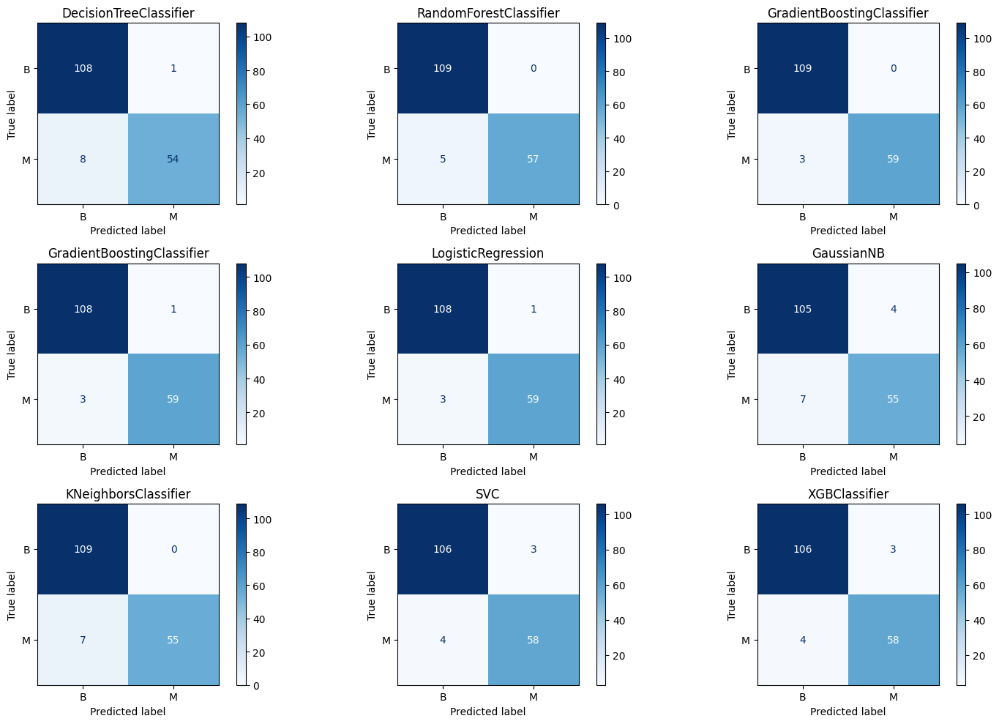

In [13]:
from sklearn.metrics import ConfusionMatrixDisplay

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15,10))

labels = ['B','M']
for cls, ax in zip(classifiers, axes.flatten()):
    ConfusionMatrixDisplay.from_estimator(cls,
                                            X_test,
                                            y_test,
                                            ax=ax,
                                            cmap='Blues',
                                            display_labels=labels,
                                            )
    ax.title.set_text(type(cls).__name__)
plt.tight_layout()
#plt.show()

In [14]:
from sklearn.metrics import classification_report

for cls, ax in zip(classifiers, axes.flatten()):
    print(cls)
    print(classification_report(y_test,cls.predict(X_test),target_names=labels))

DecisionTreeClassifier(max_depth=4)
              precision    recall  f1-score   support

           B       0.93      0.99      0.96       109
           M       0.98      0.87      0.92        62

    accuracy                           0.95       171
   macro avg       0.96      0.93      0.94       171
weighted avg       0.95      0.95      0.95       171

RandomForestClassifier(n_estimators=200, random_state=667)
              precision    recall  f1-score   support

           B       0.96      1.00      0.98       109
           M       1.00      0.92      0.96        62

    accuracy                           0.97       171
   macro avg       0.98      0.96      0.97       171
weighted avg       0.97      0.97      0.97       171

GradientBoostingClassifier()
              precision    recall  f1-score   support

           B       0.97      1.00      0.99       109
           M       1.00      0.95      0.98        62

    accuracy                           0.98       171
   m

## ROC CURVE

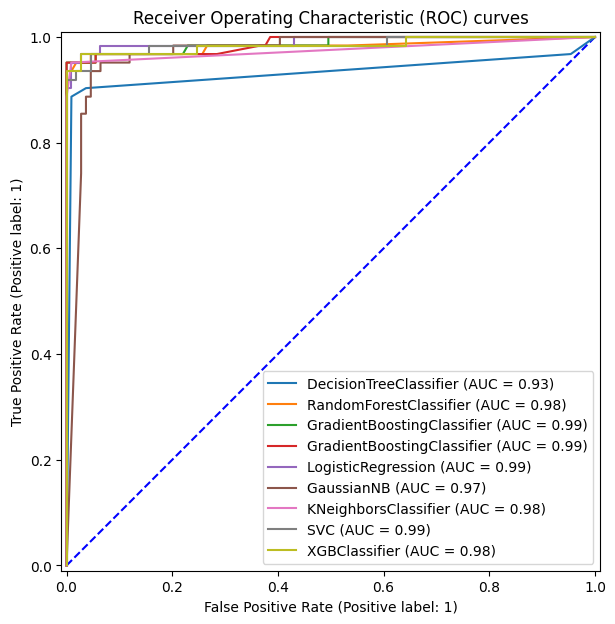

In [15]:
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import roc_auc_score

# Train the models and record the results
plt.figure(figsize=(8,7))
ax = plt.gca()
plt.plot([0,1],[0,1],'--b')

for cls in classifiers:
    model = cls.fit(X_train, y_train)
    y_score =model.predict_proba(X_test)[:, 1]
    auc_model = roc_auc_score(y_test,y_score)

    RocCurveDisplay.from_estimator(model, X_test, y_test, label=f'{cls.__class__.__name__} (AUC = {auc_model:.2f})', ax=ax)
    plt.title("Receiver Operating Characteristic (ROC) curves")
    plt.legend(loc=4)

#### Fine Tune Model with CrossValidation and GridSearch

In [16]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search
param_grid = {
            'n_estimators' : [10,50,100],
            }

selected_model = RandomForestClassifier(random_state=667)
grid_search = GridSearchCV(estimator = selected_model,
                            param_grid = param_grid,
                            cv = 5,
                            n_jobs = -1,
                            verbose = 2
                            )

In [17]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)
grid_search.best_params_

Fitting 5 folds for each of 3 candidates, totalling 15 fits


{'n_estimators': 100}

In [18]:
from sklearn.metrics import confusion_matrix

best_classifier = RandomForestClassifier(n_estimators=100,random_state=667).fit(X_train,y_train)

def make_confusion_matrix(best_classifier, threshold=0.5):
    # Predict class 1 if probability of being in class 1 is greater than threshold
    # (bestmodel.predict(X_test) is done automatically with a threshold of 0.5)
    y_pred = (best_classifier.predict_proba(X_test)[:, 1] >= threshold)
    conf = confusion_matrix(y_test, y_pred)
    plt.figure(figsize = [6,6])
    sns.heatmap(conf, cmap='Blues', annot=True, square=True, cbar=False,fmt='.0f',
                xticklabels=labels,
                yticklabels=labels
                )
    plt.xlabel('Actual')
    plt.ylabel('Prediction')
    plt.show() # This is part that needs to be added to fix the issue

# Let's see how our confusion matrix changes with changes to the cutoff!
from ipywidgets import interactive, FloatSlider
interactive(lambda threshold: make_confusion_matrix(best_classifier, threshold), threshold=(0.0,1.0,0.01))

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…

## Select the best Threshold for classifier

In [19]:
from sklearn.model_selection import FixedThresholdClassifier

best_classifier = RandomForestClassifier(n_estimators=100,random_state=667)
threshold = 0.27

classifier_th = FixedThresholdClassifier(best_classifier,
                                        threshold=threshold,
                                        response_method="predict_proba")
classifier_th.fit(X_train, y_train)

FixedThresholdClassifier(estimator=RandomForestClassifier(random_state=667),
                         response_method='predict_proba', threshold=0.27)

In [20]:
## Put these parameters inside the final Pipeline!!